In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
from sklearn.model_selection import KFold
from tabulate import tabulate

# Cross Validation spliting data

## Import Training-Val Data

In [34]:
df_Average = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\AverageTrainingVal.xlsx')
df_Skilled = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\SkilledTrainingVal.xlsx')
df_Elite = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\EliteTrainingVal.xlsx')

In [35]:
df_Elite

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redEliteMonsters,redDragons,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff
0,0,32,5,10,15,15,0,0,0,1,...,2,2,0,1,26016,22836,8.4,279,69,1063
1,1,49,6,10,14,6,1,1,0,0,...,0,0,0,1,25835,20998,8.6,301,77,3740
2,1,26,2,17,10,24,2,1,1,0,...,0,0,0,1,23499,25089,8.6,268,80,-5804
3,1,106,8,10,8,18,2,1,1,0,...,1,1,0,0,21625,21831,8.4,297,76,-2583
4,1,31,10,22,7,24,3,2,1,2,...,0,0,0,0,21954,19995,8.4,293,79,-9229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,1,24,7,6,7,8,1,1,0,0,...,2,1,1,0,23558,19954,8.6,340,100,722
8632,1,20,8,15,9,13,1,1,0,1,...,1,0,1,1,24741,23249,8.8,317,79,-1783
8633,1,26,4,17,16,21,3,2,1,1,...,0,0,0,0,25491,31258,8.6,246,62,-2358
8634,1,27,9,7,13,11,1,1,0,0,...,1,0,1,1,25270,21193,9.0,297,68,2430


### Adding and subtract variable

In [36]:
def addVar(df): 
    df['blue/redAvgLevel'] = round(df['blueAvgLevel']/df['redAvgLevel'],5)
    df['blue/redTotalDamageToChampions'] = round(df['blueTotalDamageToChampions']/df['redTotalDamageToChampions'],5)
    df['blue/redKills'] = round(df['blueKills']/df['redKills'],5)
    df = df.drop('redGoldDiff', axis=1)
    return df

In [37]:
df_Elite = addVar(df_Elite)
df_Average = addVar(df_Average)
df_Skilled = addVar(df_Skilled)
df_Elite

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,0,32,5,10,15,15,0,0,0,1,...,0,1,26016,22836,8.4,279,69,1.00000,1.09940,0.66667
1,1,49,6,10,14,6,1,1,0,0,...,0,1,25835,20998,8.6,301,77,0.97674,0.92795,0.71429
2,1,26,2,17,10,24,2,1,1,0,...,0,1,23499,25089,8.6,268,80,1.06977,1.20710,1.70000
3,1,106,8,10,8,18,2,1,1,0,...,0,0,21625,21831,8.4,297,76,1.02381,1.09880,1.25000
4,1,31,10,22,7,24,3,2,1,2,...,0,0,21954,19995,8.4,293,79,1.11905,1.73458,3.14286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,1,24,7,6,7,8,1,1,0,0,...,1,0,23558,19954,8.6,340,100,1.00000,0.80946,0.85714
8632,1,20,8,15,9,13,1,1,0,1,...,1,1,24741,23249,8.8,317,79,1.00000,0.96520,1.66667
8633,1,26,4,17,16,21,3,2,1,1,...,0,0,25491,31258,8.6,246,62,1.00000,1.12246,1.06250
8634,1,27,9,7,13,11,1,1,0,0,...,1,1,25270,21193,9.0,297,68,0.97778,1.01321,0.53846


### Clean Data for Nan, Infinite and too large value

In [38]:
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

In [39]:
df_Elite.shape

(8636, 33)

In [40]:
df_Elite = clean_dataset(df_Elite)
df_Elite

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,0.0,32.0,5.0,10.0,15.0,15.0,0.0,0.0,0.0,1.0,...,0.0,1.0,26016.0,22836.0,8.4,279.0,69.0,1.00000,1.09940,0.66667
1,1.0,49.0,6.0,10.0,14.0,6.0,1.0,1.0,0.0,0.0,...,0.0,1.0,25835.0,20998.0,8.6,301.0,77.0,0.97674,0.92795,0.71429
2,1.0,26.0,2.0,17.0,10.0,24.0,2.0,1.0,1.0,0.0,...,0.0,1.0,23499.0,25089.0,8.6,268.0,80.0,1.06977,1.20710,1.70000
3,1.0,106.0,8.0,10.0,8.0,18.0,2.0,1.0,1.0,0.0,...,0.0,0.0,21625.0,21831.0,8.4,297.0,76.0,1.02381,1.09880,1.25000
4,1.0,31.0,10.0,22.0,7.0,24.0,3.0,2.0,1.0,2.0,...,0.0,0.0,21954.0,19995.0,8.4,293.0,79.0,1.11905,1.73458,3.14286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,1.0,24.0,7.0,6.0,7.0,8.0,1.0,1.0,0.0,0.0,...,1.0,0.0,23558.0,19954.0,8.6,340.0,100.0,1.00000,0.80946,0.85714
8632,1.0,20.0,8.0,15.0,9.0,13.0,1.0,1.0,0.0,1.0,...,1.0,1.0,24741.0,23249.0,8.8,317.0,79.0,1.00000,0.96520,1.66667
8633,1.0,26.0,4.0,17.0,16.0,21.0,3.0,2.0,1.0,1.0,...,0.0,0.0,25491.0,31258.0,8.6,246.0,62.0,1.00000,1.12246,1.06250
8634,1.0,27.0,9.0,7.0,13.0,11.0,1.0,1.0,0.0,0.0,...,1.0,1.0,25270.0,21193.0,9.0,297.0,68.0,0.97778,1.01321,0.53846


In [41]:
df_Skilled.shape

(22698, 33)

In [42]:
df_Skilled = clean_dataset(df_Skilled)
df_Skilled

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,1.0,22.0,4.0,8.0,11.0,7.0,1.0,0.0,1.0,0.0,...,0.0,0.0,23226.0,24196.0,8.6,285.0,71.0,1.00000,0.99248,0.72727
1,1.0,21.0,9.0,13.0,9.0,14.0,2.0,2.0,0.0,0.0,...,0.0,0.0,23786.0,24326.0,8.8,294.0,87.0,1.02273,0.98010,1.44444
2,0.0,35.0,1.0,8.0,9.0,8.0,0.0,0.0,0.0,0.0,...,0.0,0.0,22628.0,17172.0,9.0,288.0,53.0,0.95556,1.30323,0.88889
3,0.0,73.0,4.0,9.0,2.0,6.0,2.0,1.0,1.0,0.0,...,0.0,1.0,21030.0,15260.0,8.4,332.0,79.0,1.04762,1.48938,4.50000
4,0.0,25.0,2.0,6.0,14.0,5.0,0.0,0.0,0.0,0.0,...,0.0,2.0,28309.0,26304.0,9.0,330.0,92.0,0.93333,0.81201,0.42857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22693,1.0,26.0,5.0,10.0,16.0,11.0,0.0,0.0,0.0,0.0,...,0.0,0.0,26463.0,31985.0,9.0,317.0,93.0,0.93333,0.87557,0.62500
22694,1.0,28.0,8.0,7.0,12.0,7.0,2.0,1.0,1.0,0.0,...,0.0,1.0,26211.0,21955.0,9.0,336.0,84.0,0.95556,1.15864,0.58333
22695,0.0,20.0,4.0,5.0,9.0,5.0,1.0,0.0,1.0,0.0,...,0.0,0.0,22489.0,25359.0,8.8,310.0,80.0,0.97727,0.89609,0.55556
22696,0.0,19.0,5.0,7.0,13.0,6.0,0.0,0.0,0.0,0.0,...,1.0,1.0,25044.0,24404.0,8.8,253.0,90.0,1.00000,0.86969,0.53846


In [43]:
df_Average.shape

(56158, 33)

In [44]:
df_Average = clean_dataset(df_Average)
df_Average

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,0.0,45.0,2.0,7.0,9.0,5.0,1.0,1.0,0.0,0.0,...,1.0,0.0,22419.0,19383.0,8.4,265.0,76.0,0.97619,1.03962,0.77778
1,1.0,23.0,2.0,21.0,4.0,18.0,3.0,2.0,1.0,1.0,...,0.0,1.0,17785.0,15894.0,8.2,230.0,44.0,1.09756,1.71216,5.25000
2,1.0,24.0,4.0,15.0,11.0,21.0,1.0,1.0,0.0,0.0,...,1.0,0.0,24708.0,22326.0,8.8,310.0,60.0,0.97727,1.12842,1.36364
3,0.0,21.0,4.0,14.0,20.0,10.0,1.0,0.0,1.0,0.0,...,0.0,0.0,28146.0,30193.0,9.2,284.0,84.0,0.91304,1.00437,0.70000
4,0.0,18.0,2.0,10.0,14.0,3.0,0.0,0.0,0.0,1.0,...,1.0,0.0,23430.0,27102.0,8.4,215.0,64.0,1.00000,0.93318,0.71429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56153,1.0,133.0,4.0,11.0,8.0,9.0,2.0,1.0,1.0,0.0,...,0.0,2.0,19440.0,14082.0,8.4,194.0,76.0,1.07143,1.45114,1.37500
56154,0.0,17.0,5.0,11.0,8.0,13.0,1.0,1.0,0.0,0.0,...,1.0,1.0,24574.0,22157.0,8.4,295.0,92.0,1.02381,0.90531,1.37500
56155,1.0,23.0,3.0,10.0,5.0,9.0,1.0,1.0,0.0,4.0,...,1.0,1.0,22046.0,20071.0,8.2,281.0,76.0,1.07317,1.35833,2.00000
56156,1.0,20.0,5.0,17.0,7.0,20.0,1.0,1.0,0.0,1.0,...,1.0,0.0,20931.0,18496.0,8.4,267.0,63.0,1.04762,1.34759,2.42857


In [45]:
df_Average.to_excel(excel_writer = "C:/Users/linhc/OneDrive/Documents/Sproj/DataCollection/Importantfiles/TrainingValData/AverageTrainingValNewVar.xlsx")
df_Skilled.to_excel(excel_writer = "C:/Users/linhc/OneDrive/Documents/Sproj/DataCollection/Importantfiles/TrainingValData/SkilledTrainingValNewVar.xlsx")
df_Elite.to_excel(excel_writer = "C:/Users/linhc/OneDrive/Documents/Sproj/DataCollection/Importantfiles/TrainingValData/EliteTrainingValNewVar.xlsx")

In [46]:
df_Average = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\AverageTrainingValNewVar.xlsx')
df_Skilled = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\SkilledTrainingValNewVar.xlsx')
df_Elite = pd.read_excel(r'C:\Users\linhc\OneDrive\Documents\Sproj\DataCollection\Importantfiles\TrainingValData\EliteTrainingValNewVar.xlsx')

In [47]:
df_Elite

,Unnamed: 0,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,0,0,32,5,10,15,15,0,0,0,...,0,1,26016,22836,8.4,279,69,1.00000,1.09940,0.66667
1,1,1,49,6,10,14,6,1,1,0,...,0,1,25835,20998,8.6,301,77,0.97674,0.92795,0.71429
2,2,1,26,2,17,10,24,2,1,1,...,0,1,23499,25089,8.6,268,80,1.06977,1.20710,1.70000
3,3,1,106,8,10,8,18,2,1,1,...,0,0,21625,21831,8.4,297,76,1.02381,1.09880,1.25000
4,4,1,31,10,22,7,24,3,2,1,...,0,0,21954,19995,8.4,293,79,1.11905,1.73458,3.14286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8626,8631,1,24,7,6,7,8,1,1,0,...,1,0,23558,19954,8.6,340,100,1.00000,0.80946,0.85714
8627,8632,1,20,8,15,9,13,1,1,0,...,1,1,24741,23249,8.8,317,79,1.00000,0.96520,1.66667
8628,8633,1,26,4,17,16,21,3,2,1,...,0,0,25491,31258,8.6,246,62,1.00000,1.12246,1.06250
8629,8634,1,27,9,7,13,11,1,1,0,...,1,1,25270,21193,9.0,297,68,0.97778,1.01321,0.53846


In [48]:
#Drop 1st column
df_Elite = df_Elite.iloc[: , 1:]
df_Average = df_Average.iloc[: , 1:]
df_Skilled = df_Skilled.iloc[: , 1:]

In [49]:
df_Elite

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeraldsBarons,blueTowersDestroyed,...,redHeraldsBarons,redTowersDestroyed,redTotalGold,redTotalDamageToChampions,redAvgLevel,redTotalMinionsKilled,redTotalJungleMinionsKilled,blue/redAvgLevel,blue/redTotalDamageToChampions,blue/redKills
0,0,32,5,10,15,15,0,0,0,1,...,0,1,26016,22836,8.4,279,69,1.00000,1.09940,0.66667
1,1,49,6,10,14,6,1,1,0,0,...,0,1,25835,20998,8.6,301,77,0.97674,0.92795,0.71429
2,1,26,2,17,10,24,2,1,1,0,...,0,1,23499,25089,8.6,268,80,1.06977,1.20710,1.70000
3,1,106,8,10,8,18,2,1,1,0,...,0,0,21625,21831,8.4,297,76,1.02381,1.09880,1.25000
4,1,31,10,22,7,24,3,2,1,2,...,0,0,21954,19995,8.4,293,79,1.11905,1.73458,3.14286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8626,1,24,7,6,7,8,1,1,0,0,...,1,0,23558,19954,8.6,340,100,1.00000,0.80946,0.85714
8627,1,20,8,15,9,13,1,1,0,1,...,1,1,24741,23249,8.8,317,79,1.00000,0.96520,1.66667
8628,1,26,4,17,16,21,3,2,1,1,...,0,0,25491,31258,8.6,246,62,1.00000,1.12246,1.06250
8629,1,27,9,7,13,11,1,1,0,0,...,1,1,25270,21193,9.0,297,68,0.97778,1.01321,0.53846


In [ ]:
def gragh(df_Input):   
    df=df_Input.copy()
    blue = df.iloc[:, 0:16]
    df1= df.iloc[:, 0]
    red=df.iloc[:, 15:30]
    red.insert(0,'blueWins',df1)
    rest=df.iloc[:,30:33]
    rest.insert(0,'blueWins',df1)
    g1 = scatter_matrix(blue,figsize= [100,100])
    g2 = scatter_matrix(red,figsize= [100,100])
    g3 = scatter_matrix(rest,figsize=[50,50])
    for ax in g1.ravel(),g2.ravel(),g3.ravel():
        ax.set_xlabel(ax.get_xlabel(), fontsize = 20)
        ax.set_ylabel(ax.get_ylabel(), fontsize = 20)
    print(g1)
    print(g2)
    print(g3)

[[<AxesSubplot:xlabel='blueWins', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueWardsPlaced', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueWardsDestroyed', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueKills', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueDeaths', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueAssists', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueEliteMonsters', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueDragons', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueHeraldsBarons', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueTowersDestroyed', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueTotalGold', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueTotalDamageToChampions', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueAvgLevel', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueTotalMinionsKilled', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueTotalJungleMinionsKilled', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueGoldDiff', ylabel='blueWins'>]
 [<AxesSubplot:xlabel='blueWins

[[<AxesSubplot:xlabel='blueWins', ylabel='blueWins'>
  <AxesSubplot:xlabel='blueGoldDiff', ylabel='blueWins'>
  <AxesSubplot:xlabel='redWardsPlaced', ylabel='blueWins'>
  <AxesSubplot:xlabel='redWardsDestroyed', ylabel='blueWins'>
  <AxesSubplot:xlabel='redKills', ylabel='blueWins'>
  <AxesSubplot:xlabel='redDeaths', ylabel='blueWins'>
  <AxesSubplot:xlabel='redAssists', ylabel='blueWins'>
  <AxesSubplot:xlabel='redEliteMonsters', ylabel='blueWins'>
  <AxesSubplot:xlabel='redDragons', ylabel='blueWins'>
  <AxesSubplot:xlabel='redHeraldsBarons', ylabel='blueWins'>
  <AxesSubplot:xlabel='redTowersDestroyed', ylabel='blueWins'>
  <AxesSubplot:xlabel='redTotalGold', ylabel='blueWins'>
  <AxesSubplot:xlabel='redTotalDamageToChampions', ylabel='blueWins'>
  <AxesSubplot:xlabel='redAvgLevel', ylabel='blueWins'>
  <AxesSubplot:xlabel='redTotalMinionsKilled', ylabel='blueWins'>
  <AxesSubplot:xlabel='redTotalJungleMinionsKilled', ylabel='blueWins'>]
 [<AxesSubplot:xlabel='blueWins', ylabel='blu

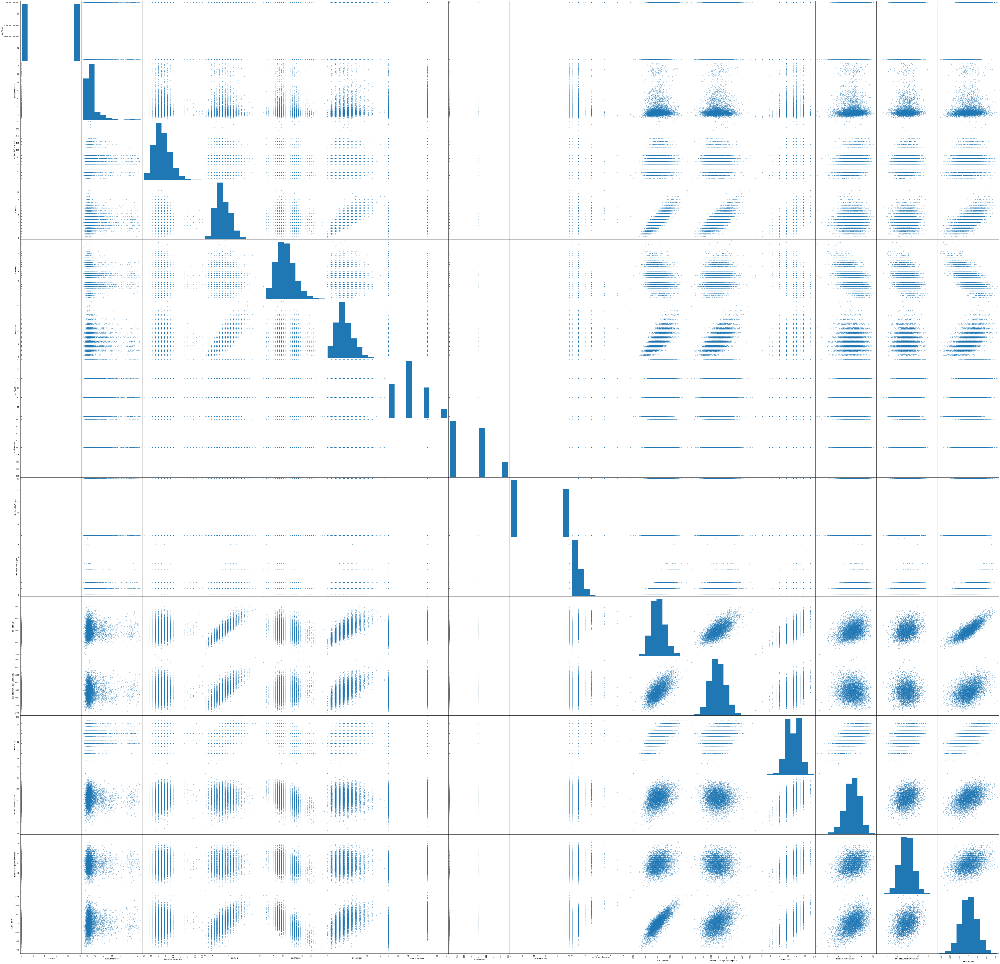

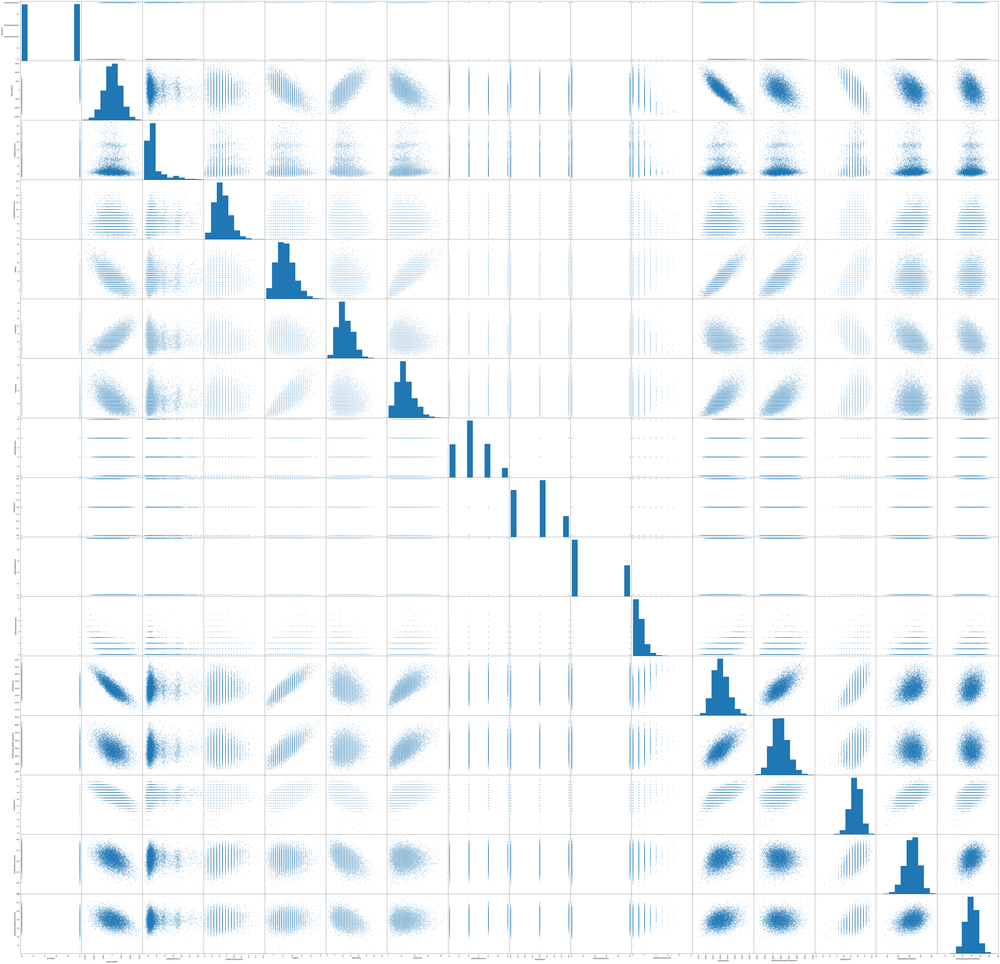

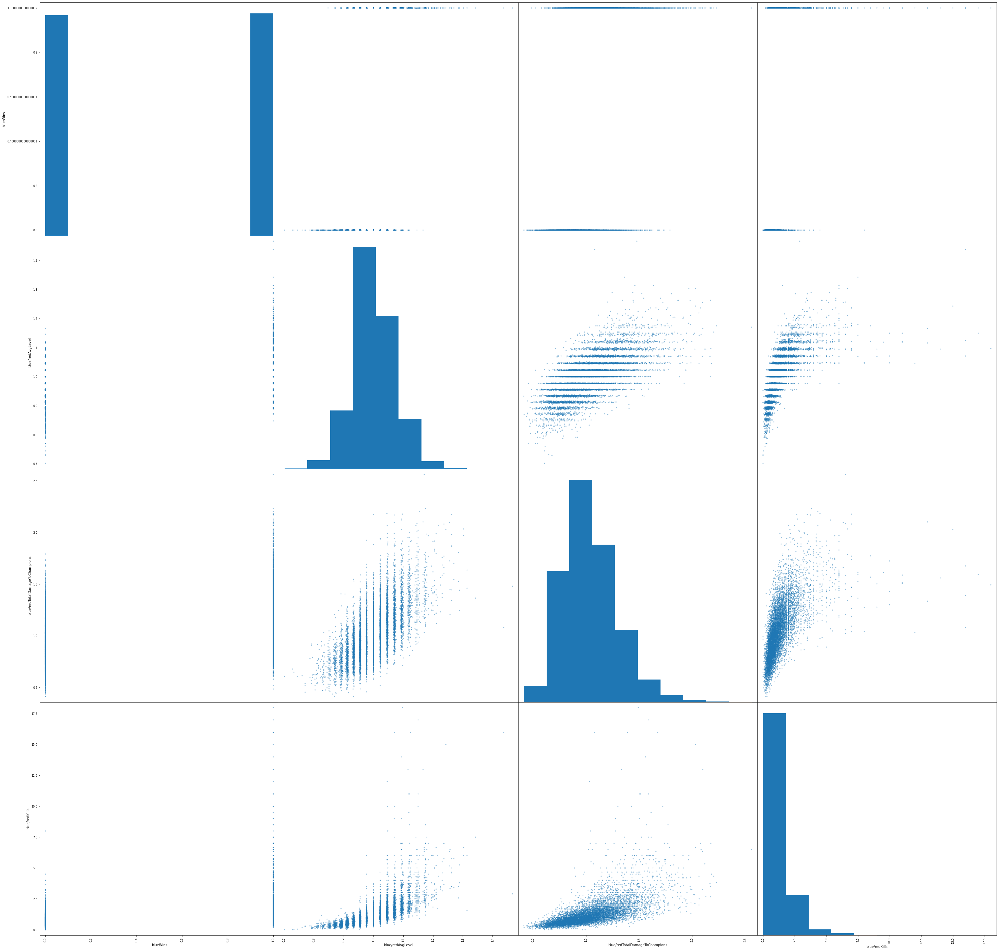

In [79]:
gragh(df_Elite)

In [ ]:
gragh(df_Skilled)